<a href="https://colab.research.google.com/github/asamiei/plasma_cell_dyscrasia_marrow_quant/blob/main/Plasma_cells_counter_bone_marrow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np 
import pandas as pd 
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import matplotlib
import glob
import ntpath
from PIL import Image
import cv2
import scipy
import skimage
from skimage.measure import label, regionprops, regionprops_table
from skimage import measure, color, io, data
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
from skimage import measure, io, img_as_ubyte
from skimage.color import label2rgb, rgb2gray, hed2rgb, rgb2hed
from skimage.segmentation import clear_border
from skimage import measure, io, img_as_ubyte
!pip install opencv-python-headless==4.1.2.30

# need the updated version of scikit image 
!pip install scikit-image==0.18.3 


     |████████████████████████████████| 21.8 MB 171 kB/s 


## Installing cellpose library

In [3]:
!pip install cellpose==0.6.5


import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from urllib.parse import urlparse
import shutil

print ("Downloading Models")
from cellpose import models


#Check GPU access
if models.use_gpu()==False: 
  #Warnings from the ZeroCost StarDist notebook
  print('Did you change your runtime ?') 
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:

  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


     |████████████████████████████████| 13.3 MB 3.6 MB/s 
  Created wheel for cellpose: filename=cellpose-0.6.5-py3-none-any.whl size=152511 sha256=dd2ff4bc57be2238a348123b6f98e35d8bde23010675aad2aab46f57f055685d
  Stored in directory: /root/.cache/pip/wheels/0e/6a/fc/e28edbe6b2f78b3ee4c011e97236b996818d86bec88e78dc64
Successfully built cellpose
creating new log file
2022-04-20 08:19:14,665 [INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log
2022-04-20 08:19:14,680 [INFO] Downloading: "https://www.cellpose.org/models/cyto_0" to /root/.cellpose/models/cyto_0



100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]

2022-04-20 08:19:18,008 [INFO] Downloading: "https://www.cellpose.org/models/cyto_1" to /root/.cellpose/models/cyto_1




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.3MB/s]

2022-04-20 08:19:21,299 [INFO] Downloading: "https://www.cellpose.org/models/cyto_2" to /root/.cellpose/models/cyto_2




100%|██████████| 25.2M/25.2M [00:02<00:00, 9.78MB/s]

2022-04-20 08:19:24,738 [INFO] Downloading: "https://www.cellpose.org/models/cyto_3" to /root/.cellpose/models/cyto_3




100%|██████████| 25.2M/25.2M [00:02<00:00, 9.77MB/s]

2022-04-20 08:19:28,183 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto_0.npy" to /root/.cellpose/models/size_cyto_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 11.5MB/s]

2022-04-20 08:19:28,749 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_0" to /root/.cellpose/models/cytotorch_0




100%|██████████| 25.3M/25.3M [00:13<00:00, 2.02MB/s]

2022-04-20 08:19:42,643 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_1" to /root/.cellpose/models/cytotorch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.4MB/s]

2022-04-20 08:19:45,936 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_2" to /root/.cellpose/models/cytotorch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.74MB/s]

2022-04-20 08:19:49,411 [INFO] Downloading: "https://www.cellpose.org/models/cytotorch_3" to /root/.cellpose/models/cytotorch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.4MB/s]

2022-04-20 08:19:52,713 [INFO] Downloading: "https://www.cellpose.org/models/size_cytotorch_0.npy" to /root/.cellpose/models/size_cytotorch_0.npy




100%|██████████| 5.23k/5.23k [00:00<00:00, 5.48MB/s]

2022-04-20 08:19:53,277 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_0" to /root/.cellpose/models/cyto2torch_0




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.73MB/s]

2022-04-20 08:19:56,740 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_1" to /root/.cellpose/models/cyto2torch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.4MB/s]

2022-04-20 08:20:00,024 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_2" to /root/.cellpose/models/cyto2torch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.68MB/s]

2022-04-20 08:20:03,502 [INFO] Downloading: "https://www.cellpose.org/models/cyto2torch_3" to /root/.cellpose/models/cyto2torch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.81MB/s]

2022-04-20 08:20:06,941 [INFO] Downloading: "https://www.cellpose.org/models/size_cyto2torch_0.npy" to /root/.cellpose/models/size_cyto2torch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 13.0MB/s]

2022-04-20 08:20:07,509 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_0" to /root/.cellpose/models/nuclei_0




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]

2022-04-20 08:20:10,795 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_1" to /root/.cellpose/models/nuclei_1




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]

2022-04-20 08:20:14,081 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_2" to /root/.cellpose/models/nuclei_2




100%|██████████| 25.2M/25.2M [00:02<00:00, 9.71MB/s]

2022-04-20 08:20:17,540 [INFO] Downloading: "https://www.cellpose.org/models/nuclei_3" to /root/.cellpose/models/nuclei_3




100%|██████████| 25.2M/25.2M [00:02<00:00, 10.4MB/s]

2022-04-20 08:20:20,828 [INFO] Downloading: "https://www.cellpose.org/models/size_nuclei_0.npy" to /root/.cellpose/models/size_nuclei_0.npy




100%|██████████| 3.55k/3.55k [00:00<00:00, 8.02MB/s]

2022-04-20 08:20:21,440 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_0" to /root/.cellpose/models/nucleitorch_0




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.81MB/s]

2022-04-20 08:20:24,889 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_1" to /root/.cellpose/models/nucleitorch_1




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.82MB/s]

2022-04-20 08:20:28,326 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_2" to /root/.cellpose/models/nucleitorch_2




100%|██████████| 25.3M/25.3M [00:02<00:00, 10.4MB/s]

2022-04-20 08:20:31,616 [INFO] Downloading: "https://www.cellpose.org/models/nucleitorch_3" to /root/.cellpose/models/nucleitorch_3




100%|██████████| 25.3M/25.3M [00:02<00:00, 9.81MB/s]

2022-04-20 08:20:35,057 [INFO] Downloading: "https://www.cellpose.org/models/size_nucleitorch_0.npy" to /root/.cellpose/models/size_nucleitorch_0.npy




100%|██████████| 3.54k/3.54k [00:00<00:00, 5.72MB/s]


2022-04-20 08:20:45,456 [INFO] ** TORCH CUDA version installed and working. **
*************************************************
Wed Apr 20 08:20:45 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    26W /  70W |   1322MiB / 15109MiB |      2%      Default |
|                               |                      |                  N/A |
+-------------------------------+------

# **Input image here:**
### ideal size for fast GPU processing < 512 x 512 pixels

size =  (1787, 2279, 3)


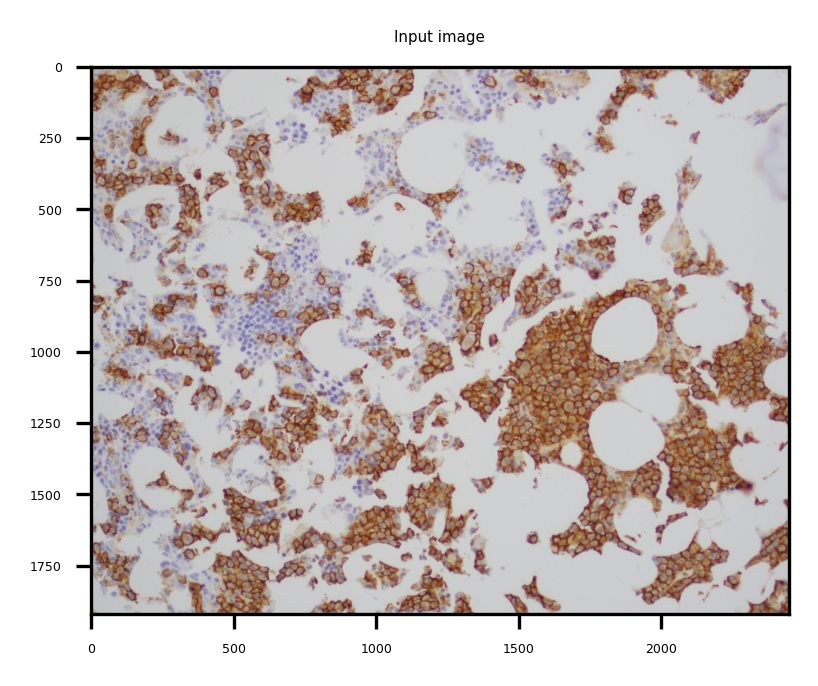

In [4]:
path = "/content/2.png"

image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print("size = ", np.shape(image))

# Ideal image size 
if np.shape(image) != (1920,2448,3):
    image = cv2.resize (image, (2448,1920), interpolation = cv2.INTER_AREA)
    print("WARNING: image resized to width/height ratio of 1.25")




matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (3,3))
plt.title("Input image")
plt.imshow(image)
plt.show()

#Automatic brightness and contrast optimization with optional histogram clipping
ideal alpha = 1 and ideal beta = 0

alpha 1.1643835616438356
beta 0.0


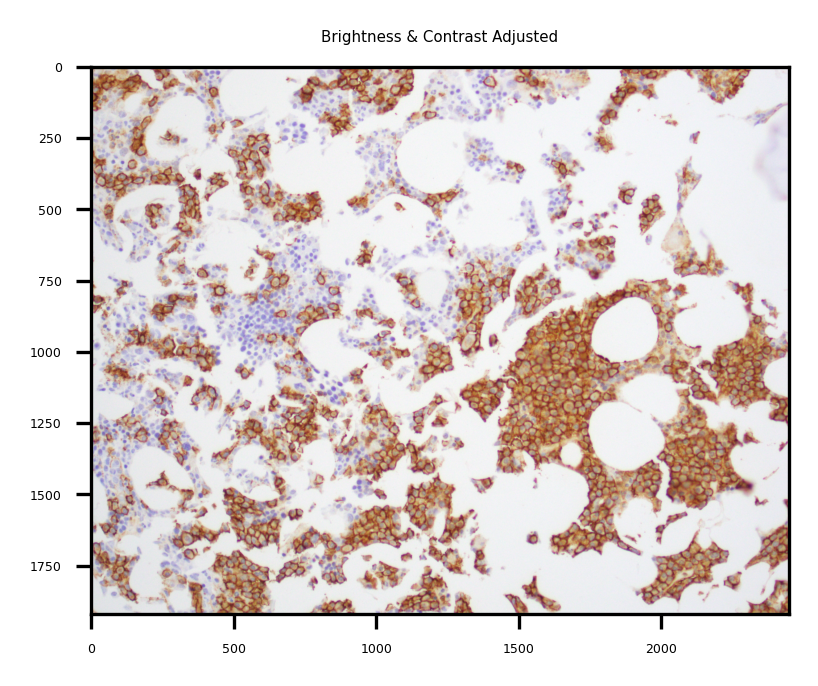

In [5]:
# https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape/56909036
# Automatic brightness and contrast optimization with optional histogram clipping

def automatic_brightness_and_contrast(image, clip_hist_percent = 0):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
    

    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return (auto_result, alpha, beta)


image_auto_corrected, alpha, beta = automatic_brightness_and_contrast(image)
print('alpha', alpha)
print('beta', beta)

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(3,3))
plt.title("Brightness & Contrast Adjusted")
plt.imshow(image_auto_corrected)
plt.show()


#Separate colors (IHC deconvolution)¶
https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html

https://github.com/scikit-image/scikit-image/issues/5164

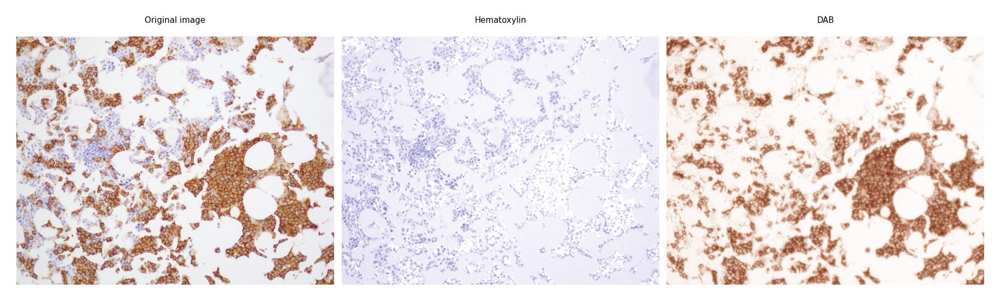

In [6]:
# Note that we have to convert to RGB b/c before this, I was making the conversion in the H&E normalization section, which I am not using here for DAB

# Separate the stains from the IHC image

ihc_hed = rgb2hed(image_auto_corrected)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(1,3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

# ax[2].imshow(ihc_e)
# ax[2].set_title("Eosin") 

ax[2].imshow(ihc_d)
ax[2].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

In [7]:
# Color deconvolution with Scikit image normalizes pixel values to [0-1]. Need to take it back to 255 range.
ihc_d_ = (ihc_d * 255).astype(np.uint8)
ihc_h_ = (ihc_h * 255).astype(np.uint8)
ihc_e_ = (ihc_e * 255).astype(np.uint8)
image_auto_corrected_ = image_auto_corrected.astype(np.uint8)

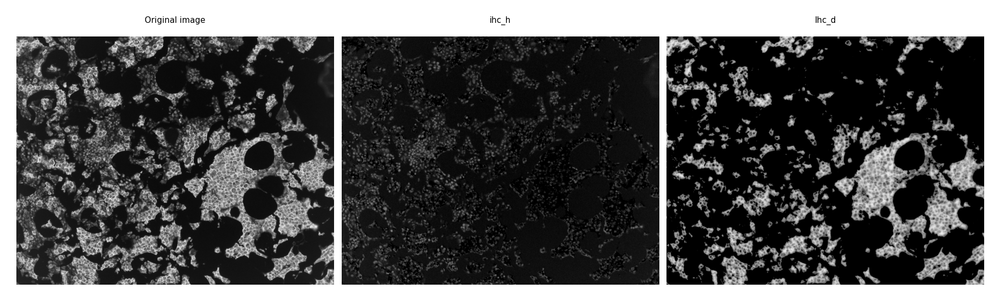

In [8]:
image_auto_corrected_gray = cv2.cvtColor(image_auto_corrected_, cv2.COLOR_RGB2GRAY)
image_auto_corrected_neg = 255 - image_auto_corrected_gray

ihc_h_gray = cv2.cvtColor(ihc_h_, cv2.COLOR_RGB2GRAY)
ihc_h_gray_neg = 255 - ihc_h_gray


ihc_d_gray = cv2.cvtColor(ihc_d_, cv2.COLOR_RGB2GRAY)
ihc_d_gray_neg = 255 - ihc_d_gray
ihc_d_gray_neg = np.where(ihc_d_gray_neg < 50, 0, ihc_d_gray_neg)


# Display
fig, axes = plt.subplots(1,3, figsize=(6,6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_auto_corrected_neg, cmap = 'gray')
ax[0].set_title("Original image")

ax[1].imshow(ihc_h_gray_neg, cmap = 'gray', vmin = 0, vmax = 255)
ax[1].set_title("ihc_h")

ax[2].imshow(ihc_d_gray_neg, cmap = 'gray')
ax[2].set_title("Ihc_d")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()


2022-04-20 08:20:55,261 [INFO] ** TORCH CUDA version installed and working. **
2022-04-20 08:20:55,262 [INFO] >>>> using GPU
2022-04-20 08:20:55,364 [INFO] ~~~ FINDING MASKS ~~~


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4004: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


2022-04-20 08:20:58,632 [INFO] >>>> TOTAL TIME 3.27 sec
2022-04-20 08:20:58,713 [INFO] ** TORCH CUDA version installed and working. **
2022-04-20 08:20:58,715 [INFO] >>>> using GPU
2022-04-20 08:20:58,789 [INFO] ~~~ FINDING MASKS ~~~
2022-04-20 08:21:02,255 [INFO] >>>> TOTAL TIME 3.47 sec
2022-04-20 08:21:02,333 [INFO] ** TORCH CUDA version installed and working. **
2022-04-20 08:21:02,334 [INFO] >>>> using GPU
2022-04-20 08:21:02,406 [INFO] ~~~ FINDING MASKS ~~~
2022-04-20 08:21:06,410 [INFO] >>>> TOTAL TIME 4.00 sec
2022-04-20 08:21:06,488 [INFO] ** TORCH CUDA version installed and working. **
2022-04-20 08:21:06,489 [INFO] >>>> using GPU
2022-04-20 08:21:06,564 [INFO] ~~~ FINDING MASKS ~~~
2022-04-20 08:21:12,481 [INFO] >>>> TOTAL TIME 5.92 sec
2022-04-20 08:21:12,564 [INFO] ** TORCH CUDA version installed and working. **
2022-04-20 08:21:12,566 [INFO] >>>> using GPU
2022-04-20 08:21:12,645 [INFO] ~~~ FINDING MASKS ~~~
2022-04-20 08:21:22,004 [INFO] >>>> TOTAL TIME 9.36 sec
2022-04-

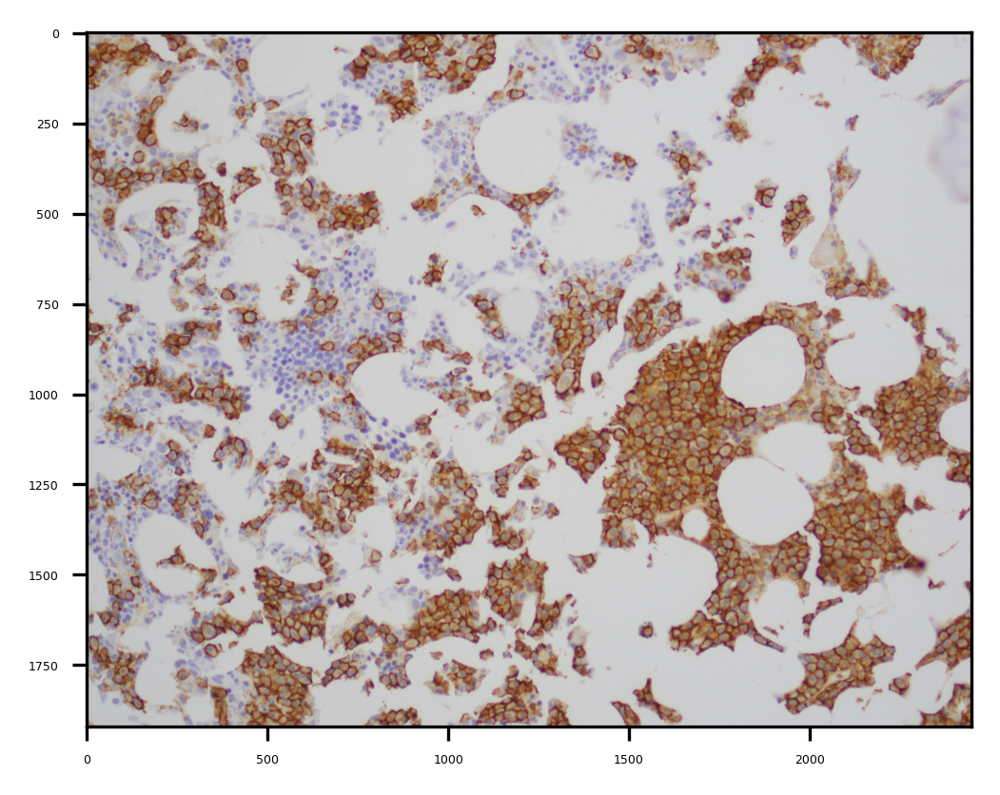

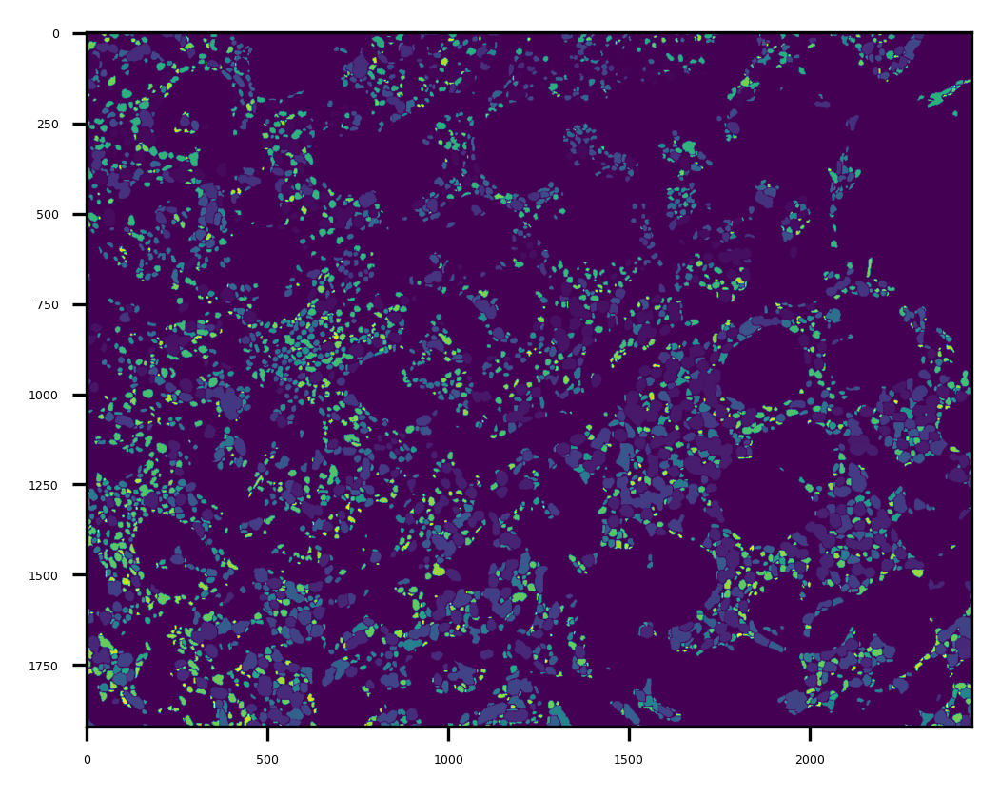

In [9]:
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
from cellpose import models, io
#!pip install cellpose

last_cell_count = 0
counter = 0


input_image = image_auto_corrected_neg

### 1. Run cellpose segmentation on the original image first ###
for i in range(40, 15, -5):
    # model_type='cyto' or model_type='nuclei'
    model = models.Cellpose(gpu= True, model_type='nuclei')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(input_image, diameter = i, channels = channels)
    
    if i == 40:
        mask_final = masks
    else:
        masks_cell_lable_updated = np.where(masks > 0, masks + last_cell_count, 0)
        mask_final = np.where(mask_final==0, masks_cell_lable_updated, mask_final) 
        

    mask_temp = np.where(masks > 0, 1, 0)
    kernel = np.ones((5,5),np.uint8)
    mask_temp_dilated = cv2.dilate(mask_temp.astype(np.uint8), kernel, iterations = 1)


    mask_temp_dilated_flipped = np.where(mask_temp_dilated == 1, 0, -1) 
    mask_temp_dilated_flipped = np.where(mask_temp_dilated_flipped == -1, 1, mask_temp_dilated_flipped) 

    input_image = np.multiply(mask_temp_dilated_flipped, input_image)
    input_image = np.where(input_image < 50, 0, input_image)
    last_cell_count = np.max(mask_final)
    


# # Transition b/w original image to Hemotoxylin channel
mask_for_ihc_h = np.where(input_image > 0, 1, 0)    # Use the black and white image, with all the "zero holes", to create the new mask
input_image = np.multiply(mask_for_ihc_h, ihc_h_gray_neg)



### 2. Run cellpose segmentation on the Hemotoxylin channel with different cell size options  ###
for i in range(35, 15, -5):
    # model_type='cyto' or model_type='nuclei'
    model = models.Cellpose(gpu= True, model_type='nuclei')
    channels = [0,0] # IF YOU HAVE GRAYSCALE
    masks, flows, styles, diams = model.eval(input_image, diameter= i, channels = channels)


    masks_cell_lable_updated = np.where(masks > 0, masks + last_cell_count, 0)
    mask_final = np.where(mask_final==0, masks_cell_lable_updated, mask_final) 


    mask_temp = np.where(masks > 0, 1, 0)
    kernel = np.ones((5,5),np.uint8)
    mask_temp_dilated = cv2.dilate(mask_temp.astype(np.uint8), kernel, iterations = 1)
    mask_temp_dilated_flipped = np.where(mask_temp_dilated == 1, 0, -1) 
    mask_temp_dilated_flipped = np.where(mask_temp_dilated_flipped == -1, 1, mask_temp_dilated_flipped) 

    input_image = np.multiply(mask_temp_dilated_flipped, input_image)
    last_cell_count = np.max(mask_final)




# Visualizing the results
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(image)
plt.show()

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(mask_final)
plt.show()


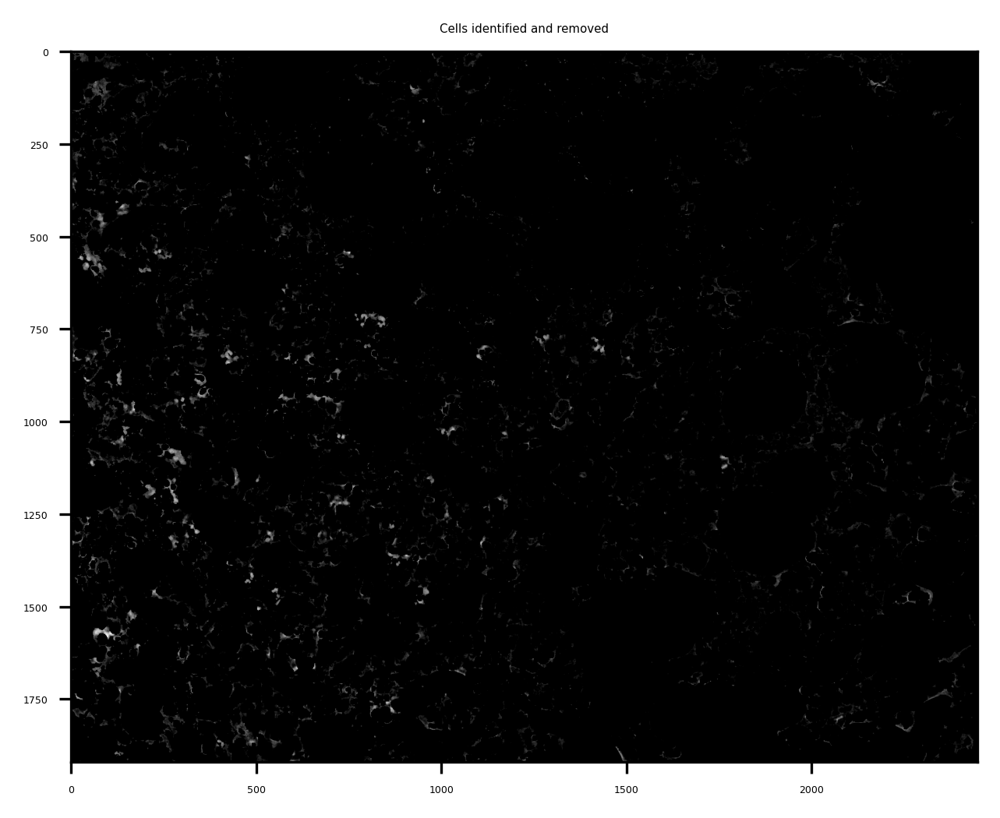

In [10]:
matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(5,5))
plt.title("Cells identified and removed")
plt.imshow(input_image, cmap = 'gray')
plt.show()

In [11]:
print("Number of total cells identified: ", np.max(mask_final))

Number of total cells identified:  4042


In [12]:
values, counts = np.unique(mask_final, return_counts=True)
len(values)

4043

In [13]:
uneroded_original_mask = np.copy(mask_final)

In [14]:
mask_final_cleared = clear_border(mask_final)

mask_final_cleared = np.where(mask_final_cleared > 0, 1, 0)
kernel = np.ones((5,5),np.uint8)
mask_final_cleared_eroded = cv2.erode(mask_final_cleared.astype(np.uint8), kernel, iterations = 0)

mask_final = mask_final * mask_final_cleared_eroded

In [15]:
values, counts = np.unique(mask_final, return_counts=True)
len(values)

3922

# Using Scikit image Region Props

In [16]:
# A function/method that will create some morphological measurements on the mask generated by cellpose

def predict_generate_cell_properties(input_cell_mask, input_image):    
    # Label each region/cell 
    masks = skimage.measure.label(input_cell_mask, background= 0, return_num= False, connectivity = 2)

    # Get properties of each region/cell
    cell_props = regionprops_table((masks), input_image, properties= ['label','area','bbox', 'centroid', 'minor_axis_length', 'major_axis_length', 'mean_intensity'])
    df = pd.DataFrame(cell_props)
    df.tail()

    return df


# Creating a nucleus datafram ONLY for visualization of nuclear segmentation results

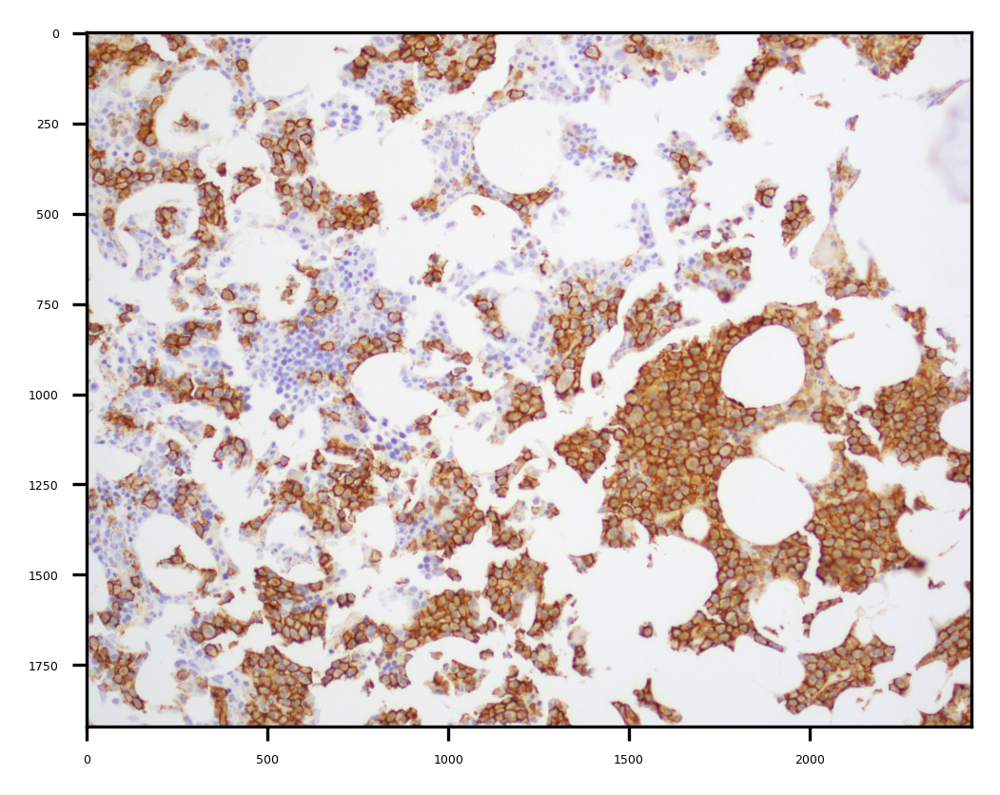

In [17]:
df_nuclei = predict_generate_cell_properties(mask_final, image_auto_corrected)
original_image_copy_total_cells = np.copy(image_auto_corrected)


matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize= (4,4))
plt.imshow(original_image_copy_total_cells)
plt.show()


In [18]:
df_nuclei

,label,area,bbox-0,bbox-1,bbox-2,bbox-3,centroid-0,centroid-1,minor_axis_length,major_axis_length,mean_intensity-0,mean_intensity-1,mean_intensity-2
0,1,380,2,1314,20,1345,11.157895,1328.086842,16.986779,31.161098,202.113158,159.618421,155.900000
1,2,150,3,344,13,361,7.766667,351.453333,10.898423,17.919777,190.153333,171.800000,193.766667
2,3,308,3,855,23,878,12.616883,865.889610,17.330323,24.456154,181.613636,157.139610,173.613636
3,4,44,3,2191,9,2200,5.545455,2194.522727,6.156742,9.098378,212.159091,192.068182,173.931818
4,5,114,4,924,20,936,10.763158,928.526316,11.329575,15.201415,155.324561,77.701754,45.245614
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3923,3924,84,1906,1170,1916,1186,1910.214286,1176.023810,8.306989,18.831652,184.773810,169.750000,166.250000
3924,3925,71,1906,1188,1911,1206,1907.816901,1196.408451,5.190247,17.826926,177.549296,137.042254,146.887324
3925,3926,108,1910,304,1919,318,1913.564815,311.287037,9.473660,15.476788,198.351852,196.944444,213.787037
3926,3927,31,1912,769,1919,774,1914.838710,771.129032,5.252359,7.473897,186.806452,139.741935,135.935484


In [19]:
from skimage.segmentation import watershed, expand_labels

# create the circumference mask by including the cell wall (eroded mask) + periphery of each cell
# Cytoplasmic ring = Expanded nuclear mask - eroded nuclear mask
# in order to include part of the nuclear mask in the cytoplasmic ring, expand/dilate the rim mask one more time (both inward and outward directions)

cytoplasm_thickness = 5
nuclei_rim_mask_ = expand_labels(mask_final, distance= cytoplasm_thickness) - mask_final 
nuclei_rim_mask = expand_labels(nuclei_rim_mask_, distance= 7)

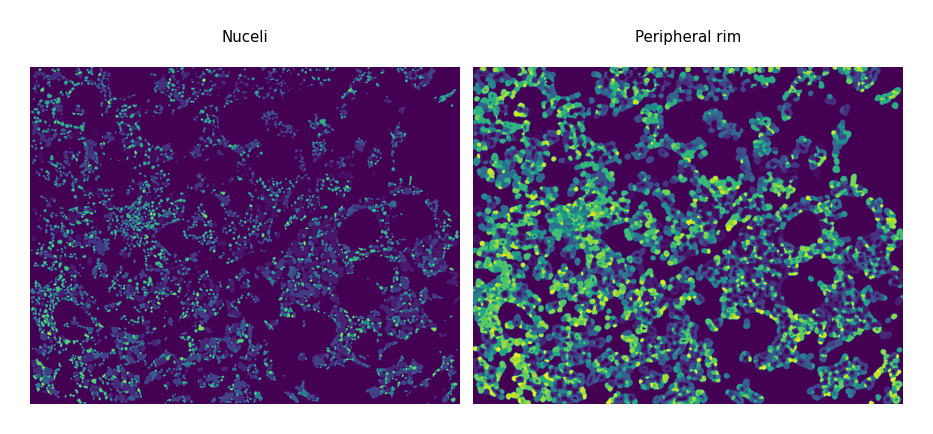

In [20]:
# Display
matplotlib.rcParams.update({'font.size': 3})

fig, axes = plt.subplots(1,2, figsize=(3,3), sharex = True, sharey = True)
ax = axes.ravel()

ax[0].imshow(mask_final)
ax[0].set_title("Nuceli")
ax[1].imshow(nuclei_rim_mask)
ax[1].set_title("Peripheral rim")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

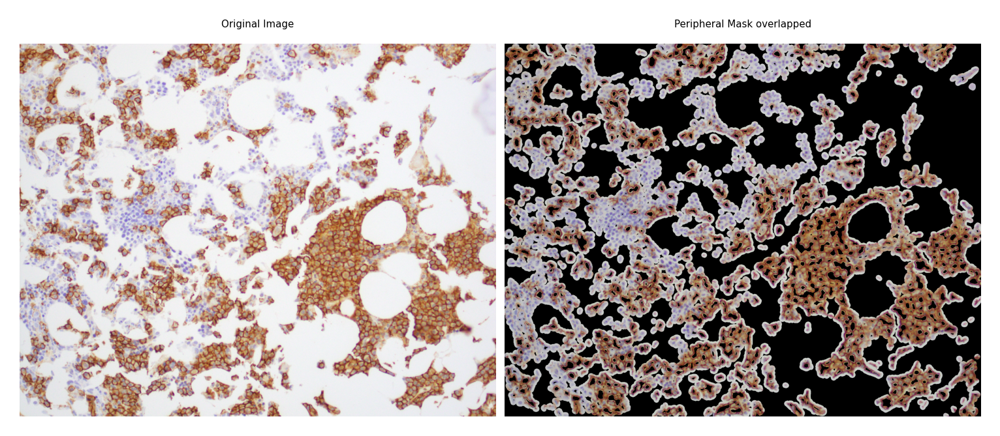

In [21]:
# Visualing borders on the original image for inspection only:

binary_nuclei_rim_mask = np.where(nuclei_rim_mask == 0, 0, 1)

B,G,R = cv2.split(image)

B = np.multiply(B, binary_nuclei_rim_mask)
G = np.multiply(G, binary_nuclei_rim_mask)
R = np.multiply(R, binary_nuclei_rim_mask)

border_image_mask = cv2.merge([B,G,R])


# Display
matplotlib.rcParams.update({'font.size': 3})

fig, axes = plt.subplots(1,2, figsize=(5,5), sharex = True, sharey = True)
ax = axes.ravel()
ax[0].imshow(image_auto_corrected)
ax[0].set_title("Original Image")
ax[1].imshow(border_image_mask)
ax[1].set_title("Peripheral Mask overlapped")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

# Just visualizing individual cell masks for inspection

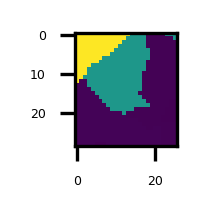

In [22]:
i = 101

cytoplasm_thickness_ = cytoplasm_thickness + 5

matplotlib.rcParams.update({'font.size': 3})
plt.figure(figsize=(0.5, 0.5))
plt.imshow(nuclei_rim_mask[df_nuclei['bbox-0'][i] - cytoplasm_thickness_ : df_nuclei['bbox-2'][i] + cytoplasm_thickness_, df_nuclei['bbox-1'][i] - cytoplasm_thickness_ : df_nuclei['bbox-3'][i] + cytoplasm_thickness_])
plt.show()

In [23]:
# np.set_printoptions(edgeitems=500, linewidth=1500, 
#     formatter=dict(float=lambda x: "%.3g" % x))

# print(nuclei_rim_mask[df_nuclei['bbox-0'][i] - cytoplasm_thickness_ : df_nuclei['bbox-2'][i] + cytoplasm_thickness_, df_nuclei['bbox-1'][i] - cytoplasm_thickness_ : df_nuclei['bbox-3'][i] + cytoplasm_thickness_])

# Defining functions to "quanitfy" stain presence

In [24]:
def DAB_intensity(image, mask):

    cell_image = image
    cell_mask_normalized = mask
    
    # Color Deconvulation only works on full image, not cropped out region w/ black background
    ihc_hed = rgb2hed(cell_image)

    # Create an RGB image for each of the stains
    null = np.zeros_like(ihc_hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

    ihc_d_norm = (ihc_d * 255).astype(np.uint8)
    ihc_d_gray = cv2.cvtColor(ihc_d_norm, cv2.COLOR_RGB2GRAY) 

    cell_image_merged = np.multiply(ihc_d_gray, cell_mask_normalized)
    ihc_d_flat = np.ndarray.flatten(cell_image_merged)

    # Remove background black pixels (=0) from the calculations
    ihc_d_flat_fg = ihc_d_flat[ihc_d_flat != 0]

    # Total box area - AUC (brightness curve) = AUC for dark pixels
    DAB_index_AUC = (255 * len(ihc_d_flat_fg)) - np.sum(ihc_d_flat_fg)
    Area_2D_image = len(ihc_d_flat_fg)
    DAB_index_AUC_norm =  DAB_index_AUC / Area_2D_image
    DAB_index_AUC_norm_index = DAB_index_AUC_norm / 255

    return DAB_index_AUC_norm_index


In [25]:
# Is there partial circle staining or full-circle staining ?
def Partial_circle_DAB(image, mask):

    quarter_counter = 0
    image_ = image
    mask_ = mask


    y, x, ch = np.shape(image_)
    cy = int(y/2)
    cx = int(x/2)



    LUQ = DAB_intensity(image_[:cy , :cx], mask_[:cy , :cx]) > proposed_stain_threshold
    LLQ = DAB_intensity(image_[cy: , :cx], mask_[cy: , :cx]) > proposed_stain_threshold
    RUQ = DAB_intensity(image_[:cy , cx:], mask_[:cy , cx:]) > proposed_stain_threshold
    RLQ = DAB_intensity(image_[cy: , cx:], mask_[cy: , cx:]) > proposed_stain_threshold      

    if LUQ == True:
        quarter_counter += 1
    if LLQ == True:
        quarter_counter += 1
    if RUQ == True:
        quarter_counter += 1      
    if RLQ == True:
        quarter_counter += 1


    if quarter_counter > 1:
        partial_circle = True
    else:
        partial_circle = False
    

    return partial_circle



In [30]:
from keras.models import load_model

model_CD138_counter = load_model('/content/drive/MyDrive/Colab Notebooks/saved_models/CD138_Binary_classification_40x40_April_15th.h5', compile = False)

In [27]:
cytoplasm_thickness = cytoplasm_thickness + 5

In [31]:
#!pip install scikit-image==0.18.3
from skimage.color import rgb2hed, hed2rgb

def Deconvolve_DAB(img):
    # Separate the stains from the IHC image
    ihc_hed = rgb2hed(img)

    # Create an RGB image for each of the stains
    null = np.zeros_like(ihc_hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))
    
    #return img
    return (ihc_d * 255).astype(np.uint8)


CD138+ count =  985
Total cell count = 2739


Staining percentage = 35.96%




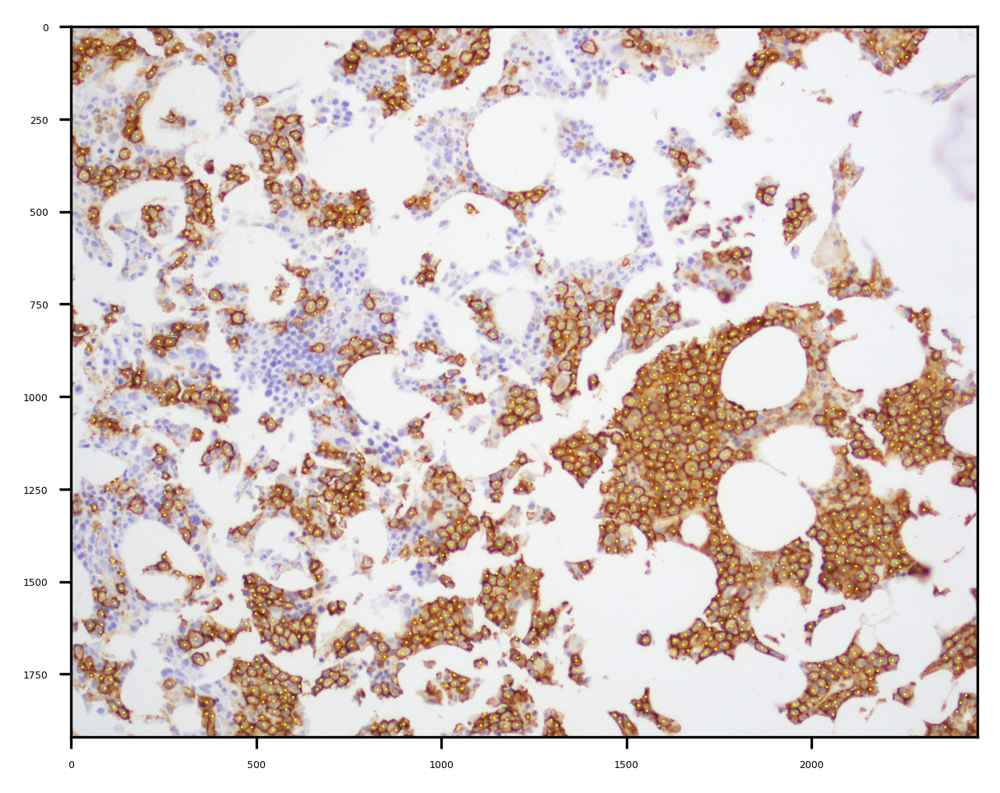

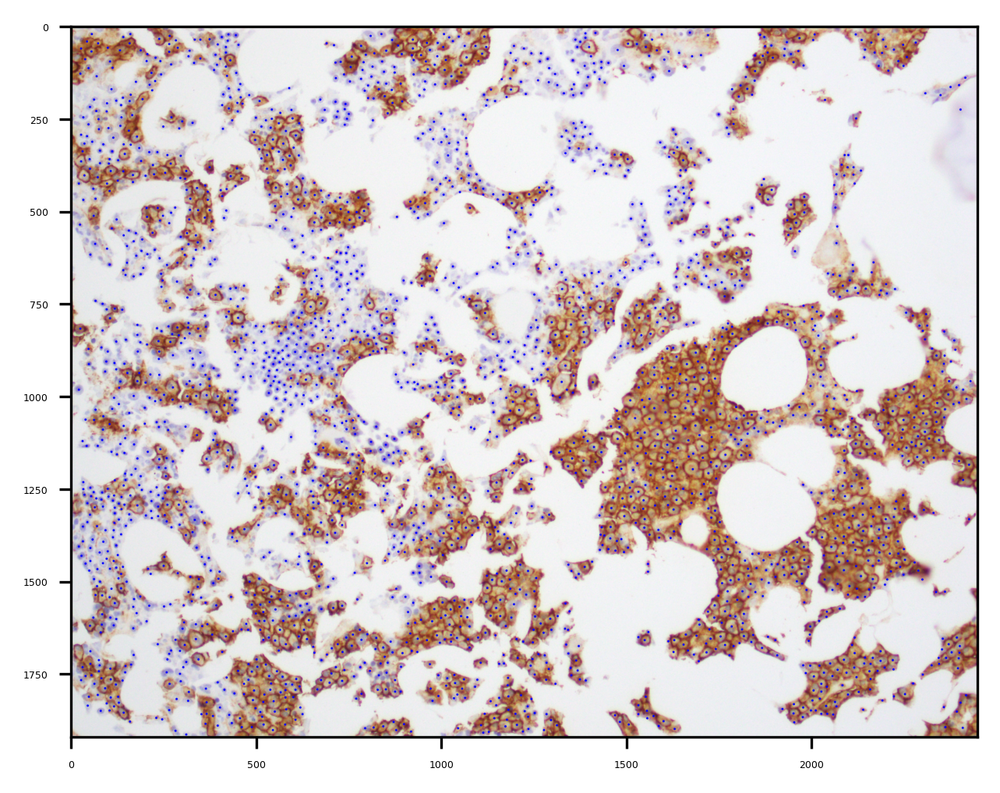

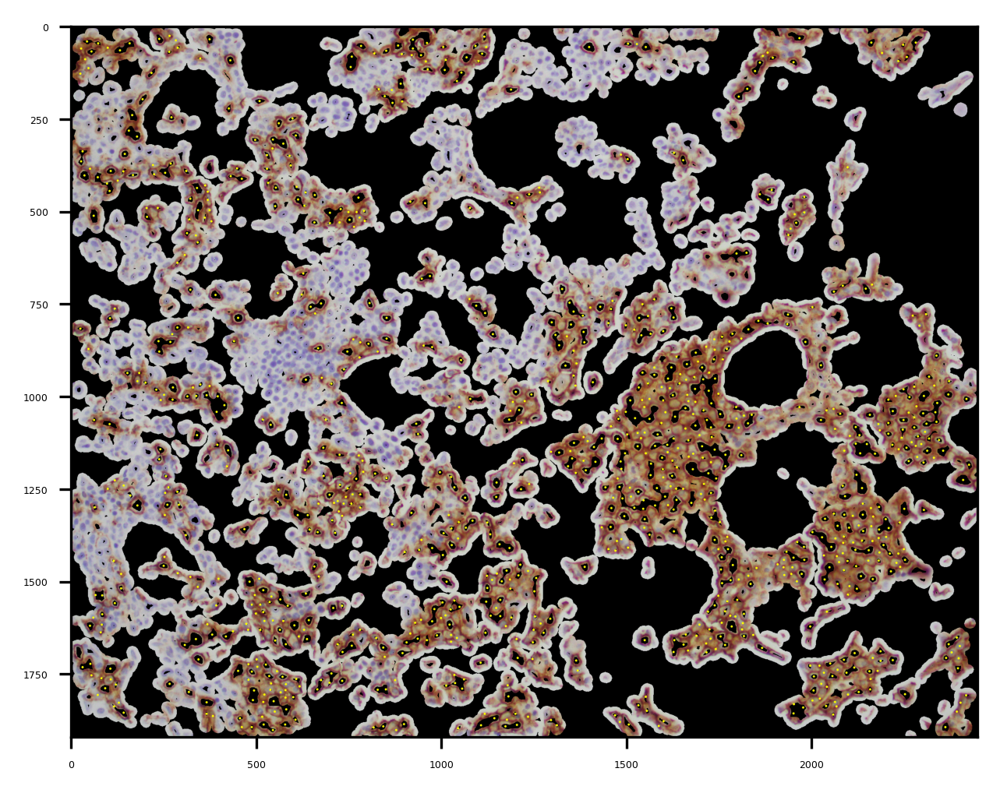

In [32]:
CD138_counter = 0
Tota_cell_counter = 0
DAB_index_values = []
Partial_circle_DAB_array = []
False_nuclear_staining_level_array = []
proposed_stain_threshold  = 0.25
CNN_ideal_threshold = 0.01


original_image_copy_CD138_ver2 = np.copy(image_auto_corrected)
original_image_copy_Total_Cells_ver2 = np.copy(image_auto_corrected)
border_image_mask_copy_CD138_ver2 = np.copy(border_image_mask)


for i in range(len(df_nuclei)):
    if df_nuclei['area'][i] > 100:   # Exclude cells smaller than ~10 pixel in diameter

        # Image crop
        image_crop_ = image_auto_corrected [df_nuclei['bbox-0'][i] - cytoplasm_thickness : df_nuclei['bbox-2'][i] + cytoplasm_thickness, df_nuclei['bbox-1'][i] - cytoplasm_thickness : df_nuclei['bbox-3'][i] + cytoplasm_thickness]
        h, w, d = np.shape(image_crop_)

        if h > 10 and w > 10:
            # model expect 40x40 RGB (specifically, DAB channel only)
            ihc_d_crop = Deconvolve_DAB(image_crop_)
            ihc_d_crop_40x40 = cv2.resize(ihc_d_crop, (40,40),interpolation=cv2.INTER_AREA)
            ihc_d_crop_40x40_ = np.expand_dims(ihc_d_crop_40x40, axis = 0)

            if model_CD138_counter.predict(ihc_d_crop_40x40_) > CNN_ideal_threshold:

                CD138_counter += 1   
                cv2.circle(original_image_copy_CD138_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (255,255,0), -1)
                cv2.circle(border_image_mask_copy_CD138_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (255,255,0), -1)

            # Total cell image
            Tota_cell_counter += 1
            cv2.circle(original_image_copy_Total_Cells_ver2,(df_nuclei.loc[i, ['centroid-1']], df_nuclei.loc[i, ['centroid-0']]), 3, (0,0,255), -1)


# Save a local copy of the results
from PIL import Image
im = Image.fromarray(original_image_copy_CD138_ver2)
im.save('/content/CD138_{}.jpeg'.format(ntpath.basename(path)))         

im = Image.fromarray(original_image_copy_Total_Cells_ver2)
im.save('/content/Total_{}.jpeg'.format(ntpath.basename(path)))         


print("CD138+ count = ", CD138_counter)
print("Total cell count =", Tota_cell_counter)
print("\n")
print("Staining percentage = {}%".format(np.round(100 * (CD138_counter / Tota_cell_counter), decimals = 2)))
print("\n")

plt.figure(figsize= (5,5))
plt.imshow(original_image_copy_CD138_ver2)
plt.show()

plt.figure(figsize= (5,5))
plt.imshow(original_image_copy_Total_Cells_ver2)
plt.show()


plt.figure(figsize= (5,5))
plt.imshow(border_image_mask_copy_CD138_ver2)
plt.show()

